In [5]:
import sys
import os
import numpy as np
import cortex
import matplotlib.pyplot as plt
import pickle

HRFindex
HRFindexrun
glmbadness
pcvoxels
pcnum
2
xvaltrend
noisepool
pcregressors
betasmd
R2
R2run
rrbadness
FRACvalue
scaleoffset
meanvol
------------------

(327684, 144)
(327684,)
HRFindex
HRFindexrun
glmbadness
pcvoxels
pcnum
2
xvaltrend
noisepool
pcregressors
betasmd
R2
R2run
rrbadness
FRACvalue
scaleoffset
meanvol
------------------

(327684, 180)
(327684,)
HRFindex
HRFindexrun
glmbadness
pcvoxels
pcnum
2
xvaltrend
noisepool
pcregressors
betasmd
R2
R2run
rrbadness
FRACvalue
scaleoffset
meanvol
------------------

(327684, 160)
(327684,)


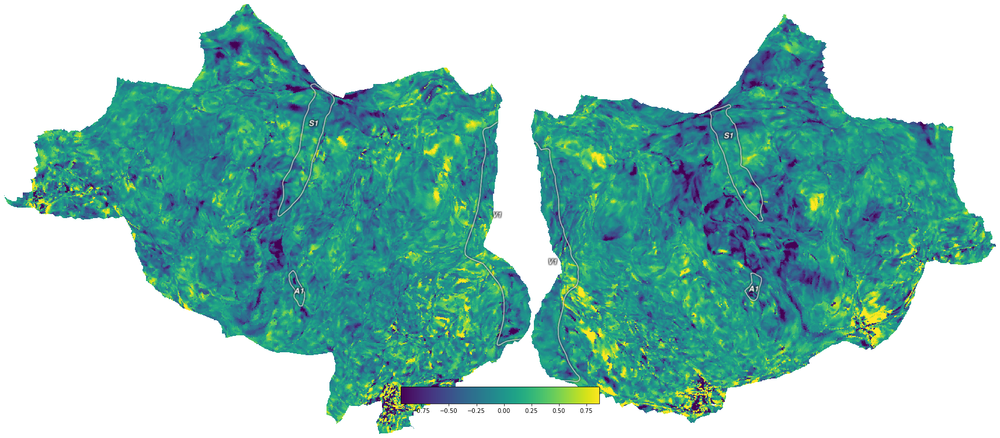

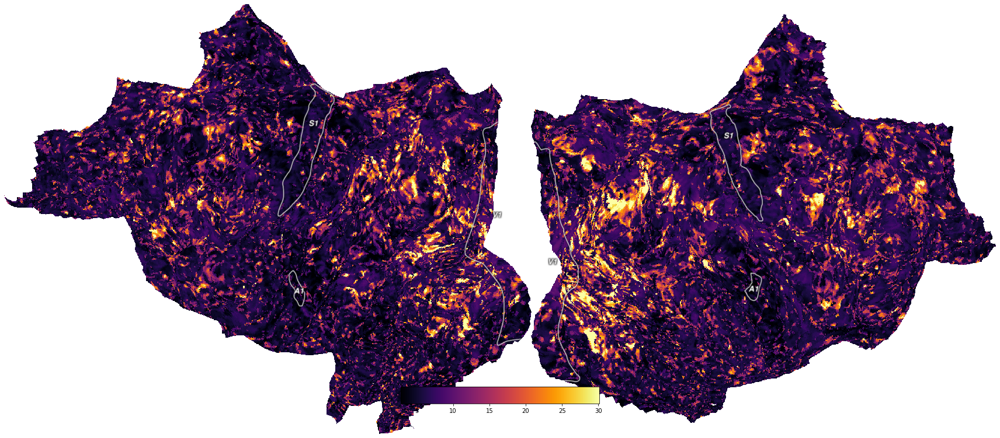

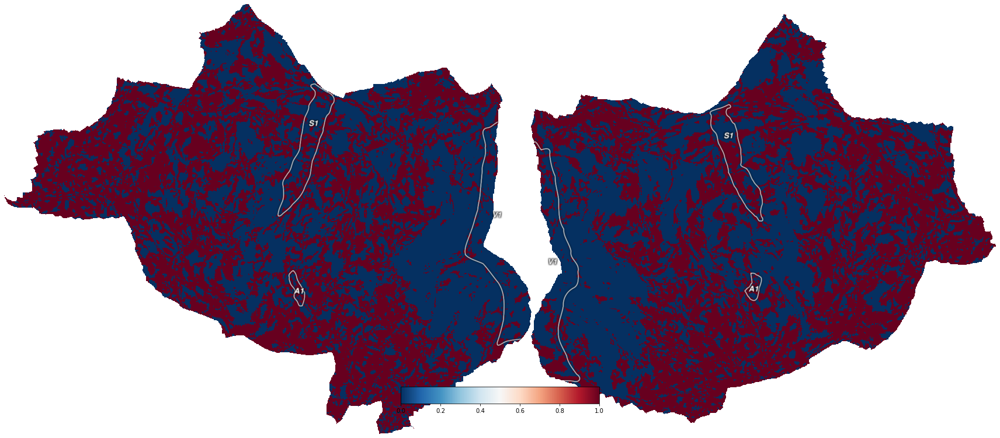

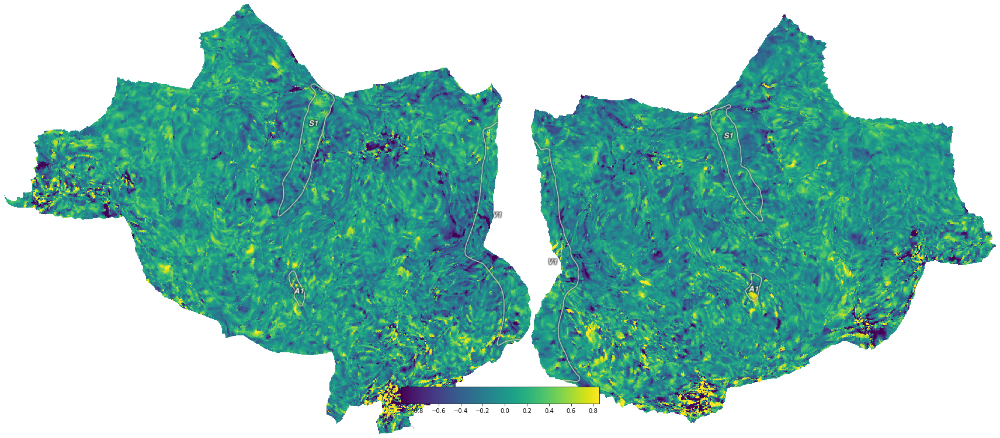

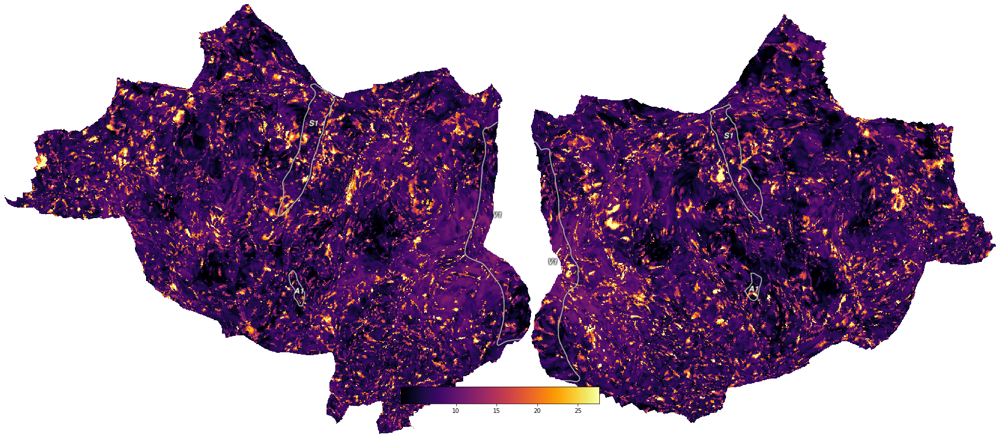

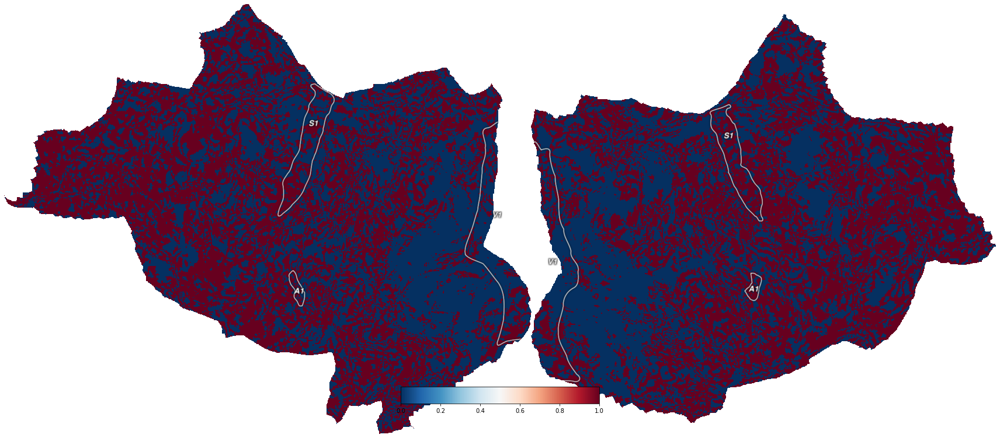

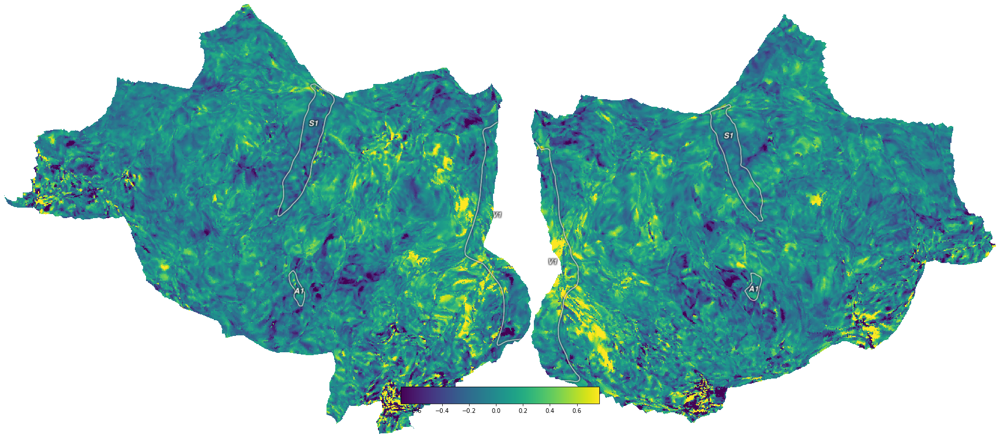

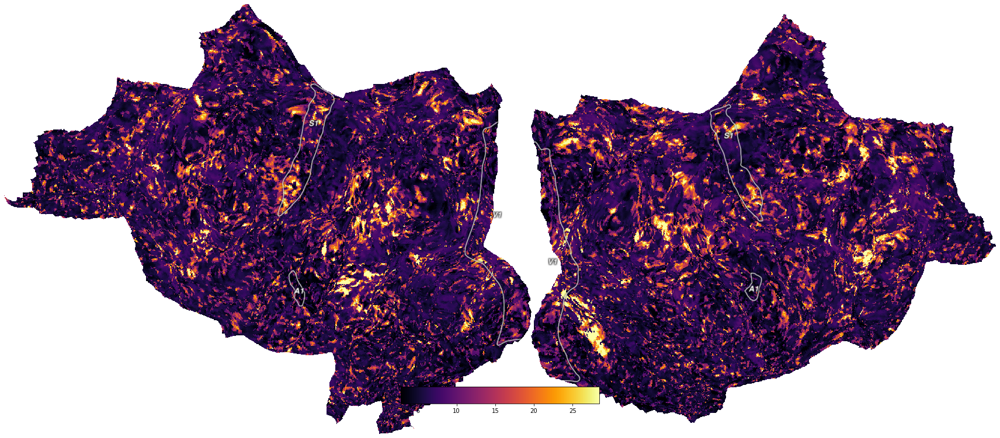

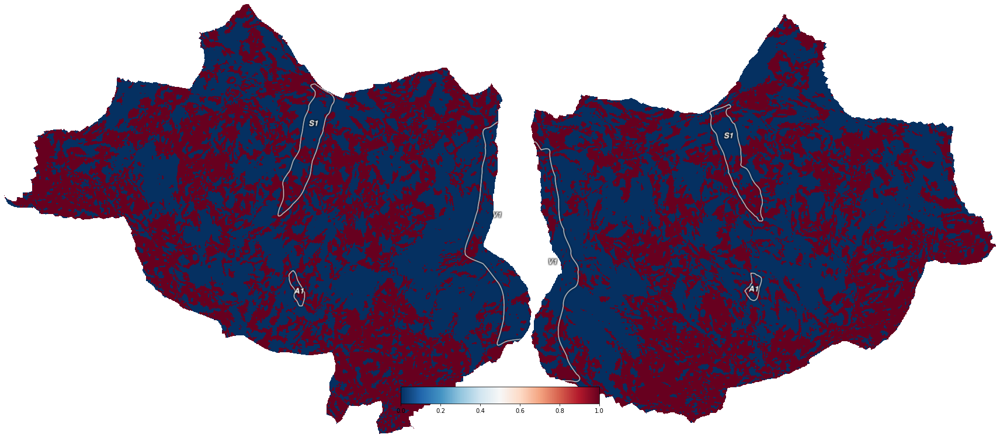

In [6]:
#test_data_paths = [f'/tank/shared/2022/arrow_of_time/arrow_of_time/aot/analysis/glmsingle/output6_last5_pc3_poollimited/{task}/TYPEA_ONOFF.npy' for task in [72]]#,90,80,"all"]]
#test_data_paths = [f'/tank/shared/2022/arrow_of_time/arrow_of_time/aot/analysis/glmsingle/output6_last5_pc3_poollimited/{task}/TYPEB_FITHRF.npy' for task in [72]]#,90,80,"all"]]
#test_data_paths = [f'/tank/shared/2022/arrow_of_time/arrow_of_time/aot/analysis/glmsingle/output6_last5_pc3_poollimited/{task}/TYPEC_FITHRF_GLMDENOISE.npy' for task in [72,90,80]]#,"all"]]
test_data_paths = [f'/tank/shared/2022/arrow_of_time/arrow_of_time/aot/analysis/glmsingle/output6_last5_pc3_poollimited/{task}/TYPED_FITHRF_GLMDENOISE_RR.npy' for task in [72,90,80]]#,"all"]]
test_data = [np.load(test_data_path,allow_pickle=True).item() for test_data_path in test_data_paths]
# test_data = test_data.item()
#print(test_data)

#output6_last5_pc3_poollimited:truncate last 5 slices

#tasks = ['all']

for index in range(len(test_data)):

    for key in test_data[index]:
        print(key)
        if key == 'pcnum':
            print(test_data[index][key])
    print('------------------')
    print()



    #onoffR2 = test_data[index]['onoffR2']
    R2 = test_data[index]['R2']
    #meanvol = test_data[index]['meanvol']
    noisepool = test_data[index]['noisepool']
    #HRFindex = test_data[index]['HRFindex']
    #fracvalue = test_data[index]['FRACvalue']
    # print(test_data['meanvol'])
    #print(test_data[index]['noisepool'].shape)
    #print(test_data[index]['R2'].shape)
    #print(noisepool)

    betas = test_data[index]['betasmd']
    print(betas.shape)
    # #switch the first and second dimension
    # betas = np.swapaxes(betas,0,1)

    betamean = np.mean(betas,axis=1)
    print(betamean.shape)

    # dataslice = data_for_plot[10]
    # print(dataslice.shape)

    data_to_plot1=cortex.Vertex(data=betamean,subject='fsaverage_tk',cmap="viridis")#,description=str(tasks[index]))
    data_to_plot2=cortex.Vertex(data=R2,subject='fsaverage_tk', cmap='inferno')#,description=str(tasks[index]))
    #data_to_plot3=cortex.Vertex(data=HRFindex,subject='fsaverage_tk',cmap="jet")#,description=str(tasks[index]))
    #data_to_plot4=cortex.Vertex(data=fracvalue,subject='fsaverage_tk',cmap="copper")#,description=str(tasks[index]))
    data_to_plot5=cortex.Vertex(data=noisepool,subject='fsaverage_tk',cmap="RdBu_r",vmin=0,vmax=1)#,description=str(tasks[index]))
    flatmap=cortex.quickshow(data_to_plot1)
    flatmap=cortex.quickshow(data_to_plot2)
    #flatmap=cortex.quickshow(data_to_plot3)
    #flatmap=cortex.quickshow(data_to_plot4)
    flatmap=cortex.quickshow(data_to_plot5)
    #plt.show()



In [7]:
#flatmap=cortex.quickshow(data_to_plot4)

In [8]:


data_to_plot=cortex.Vertex(data=test_data[0]['rrbadness'],subject='fsaverage_tk',cmap="copper",description=str(tasks[index]))
flatmap=cortex.quickshow(data_to_plot)
 


NameError: name 'tasks' is not defined

In [ ]:
cortex.db

Pycortex database
  Subjects:
   001
   S1
   fsaverage_tk

In [ ]:
cortex.database.default_filestore

'/tank/zhangs/anaconda3/share/pycortex/db'

(327684,)


(327684,)
(327684,)


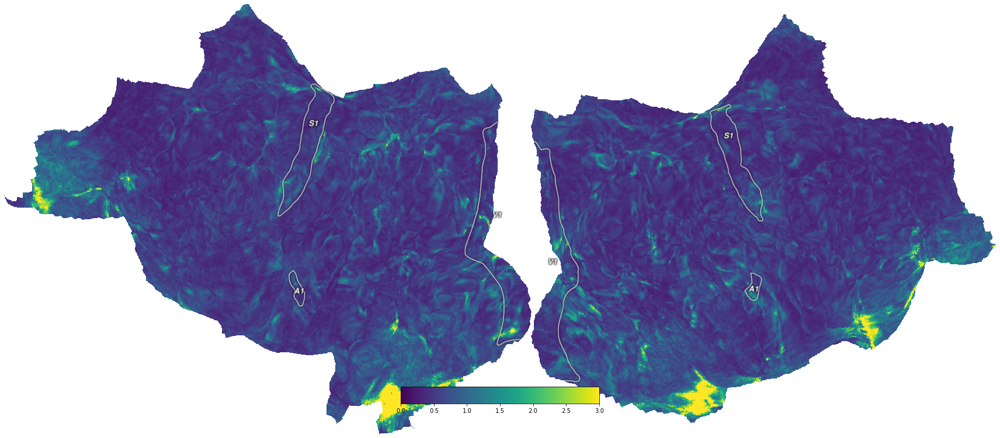

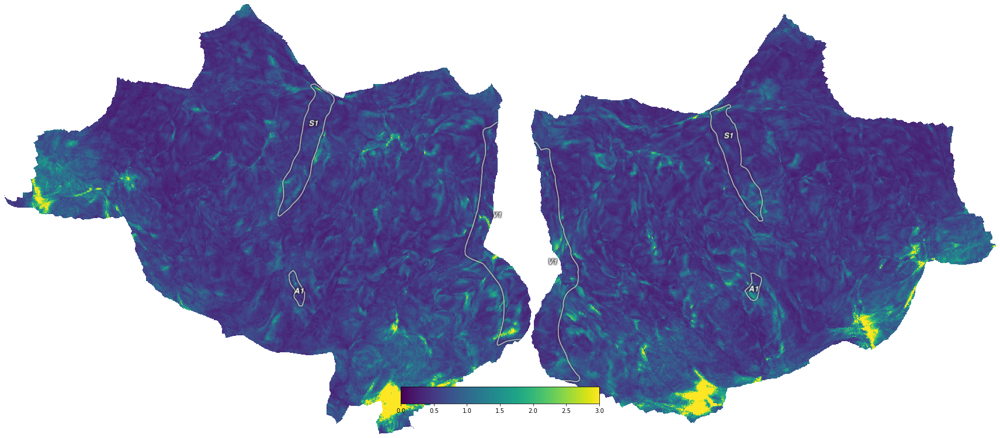

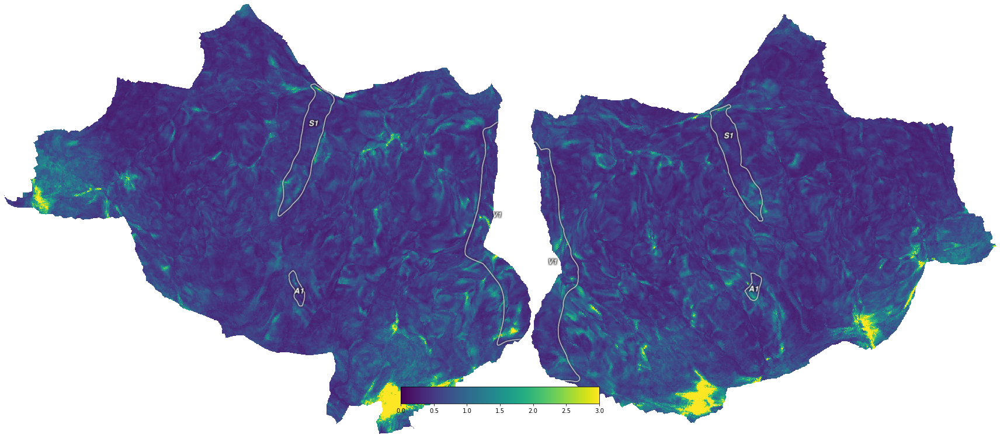

In [ ]:
#draw the comparison between the three tasks
#/tank/shared/2022/arrow_of_time/arrow_of_time/aot/analysis/glmsingle/output/average_distance_map_72.pkl
tasks = ['72','90','80']
for index in range(len(tasks)):
    average_distance_map = pickle.load(open(f'/tank/shared/2022/arrow_of_time/arrow_of_time/aot/analysis/glmsingle/output/average_distance_map_{tasks[index]}.pkl','rb'))
    print(average_distance_map.shape)
    data_to_plot=cortex.Vertex(data=average_distance_map,subject='fsaverage_tk',cmap="viridis",description=str(tasks[index]),vmin=0,vmax=3)
    flatmap=cortex.quickshow(data_to_plot)
    


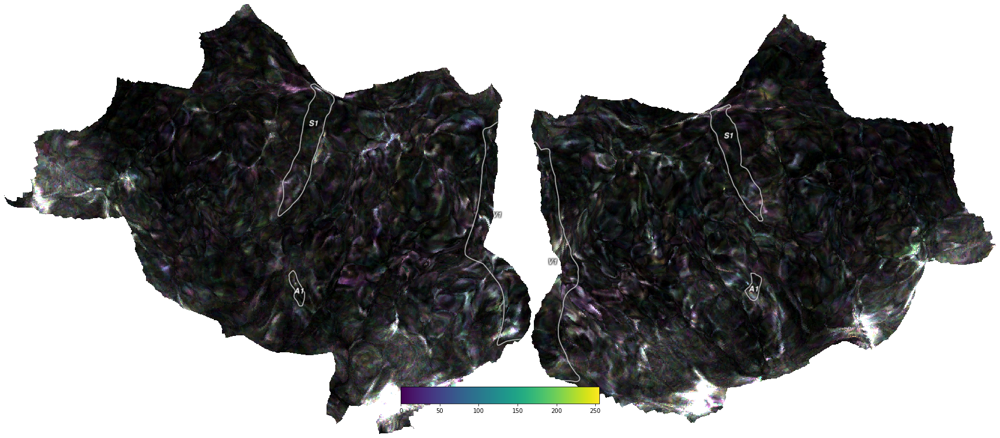

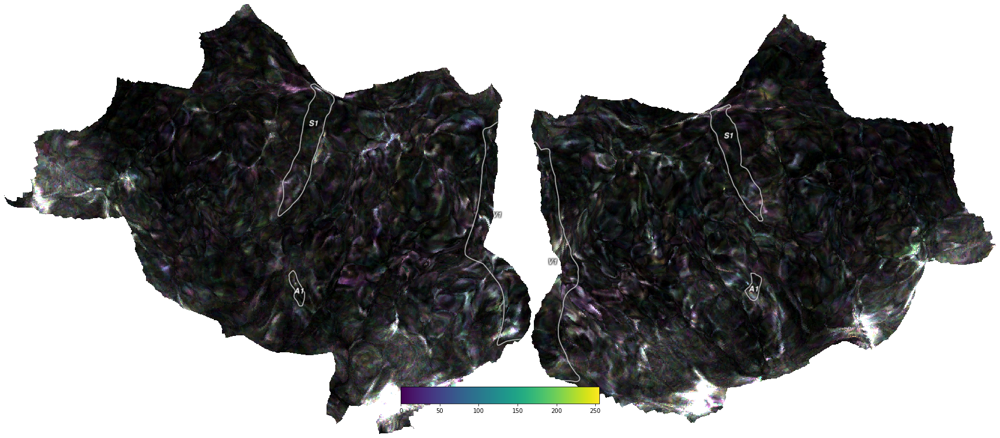

In [ ]:

average_distance_maps = np.array([pickle.load(open(f'/tank/shared/2022/arrow_of_time/arrow_of_time/aot/analysis/glmsingle/output/average_distance_map_{tasks[index]}.pkl','rb')) for index in range(len(tasks))])
data_to_plot = cortex.VertexRGB(red=average_distance_maps[0], green=average_distance_maps[1], blue=average_distance_maps[2],subject='fsaverage_tk',vmin=0,vmax=0.05, show_colorbar=False, description='average_distance_map')
cortex.quickshow(data_to_plot, show_colorbar=False)

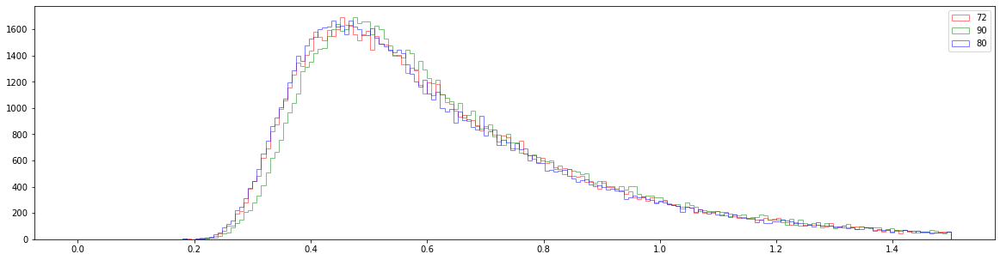

In [ ]:
mask = R2 > 5
masked_average_distance_maps = average_distance_maps[:,mask]
plt.figure(figsize=(20,5))
plt.hist(bins=200, x=masked_average_distance_maps[0], color='red', alpha=0.5, label='72', range=(0,1.5), cumulative=False, histtype='step')
plt.hist(bins=200, x=masked_average_distance_maps[1], color='green', alpha=0.5, label='90', range=(0,1.5), cumulative=False, histtype='step')
plt.hist(bins=200, x=masked_average_distance_maps[2], color='blue', alpha=0.5, label='80', range=(0,1.5), cumulative=False, histtype='step')
plt.legend()

In [ ]:
tasks

['72', '90', '80']

In [ ]:
average_distance_maps.shape, mask.shape

((3, 327684), (327684,))